In [ ]:
#Joint analysis visualization(5Set)

In [8]:
import scanpy as sc
import numpy as np 
import pandas as pd 
from glob import glob
import re
import seaborn as sns
import matplotlib.pyplot as plt 
from tqdm import tqdm
import os
from collections import Counter
import time
import cosg as cosg
%matplotlib inline
import harmonypy

In [ ]:
#GSE142445

In [2]:
#adata = sc.read(f'/home/xll/HIE/GSE142445/AB.h5ad')
adata = sc.read(f'/home/xll/HIE/GSE142445/scRNA.h5ad')
adata

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


AnnData object with n_obs × n_vars = 4364 × 17512
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'RNA_snn_res.0.3', 'group', 'celltype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

In [3]:
#可视化
# 导包
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

# 设置全局参数
#sc.set_figure_params(dpi=600, color_map = 'viridis_r')
#sc.settings.verbosity = 1
#sc.logging.print_header()

In [6]:
# 替换值
adata.obs['celltype'] = adata.obs['celltype'].replace({
    "SPP1H": "SPP1high","SPP1L": "SPP1low"})

adata.obs['celltype'] = adata.obs['celltype'].astype('category')

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


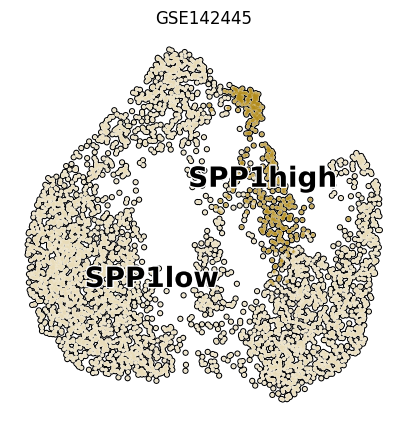

In [14]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='celltype', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='GSE142445',  # 设置标题
               palette=['#B28B1A','#E8DBB7'],  # 设置颜色主题
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/GSE142445(celltype).pdf",dpi=300)

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


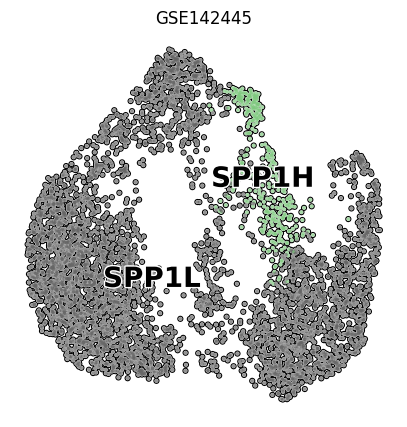

In [5]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='seurat_clusters', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='GSE142445',  # 设置标题
               palette='Accent',  # 设置颜色主题
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/GSE142445.pdf",dpi=300)

In [57]:
marker_genes_dict = {
    '0': ["C1qa","Csf1r","P2ry12",'Tmem119',"Igf1","Spp1","Ccl4","Ccl3","Csf1","Gpnmb",
          "Plin2","Dab2","Srxn1","Olr1","Clic4","Rai14","Ccl3","Lgals3","Lpl"]
}

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_RNA_snn_res.0.3']`


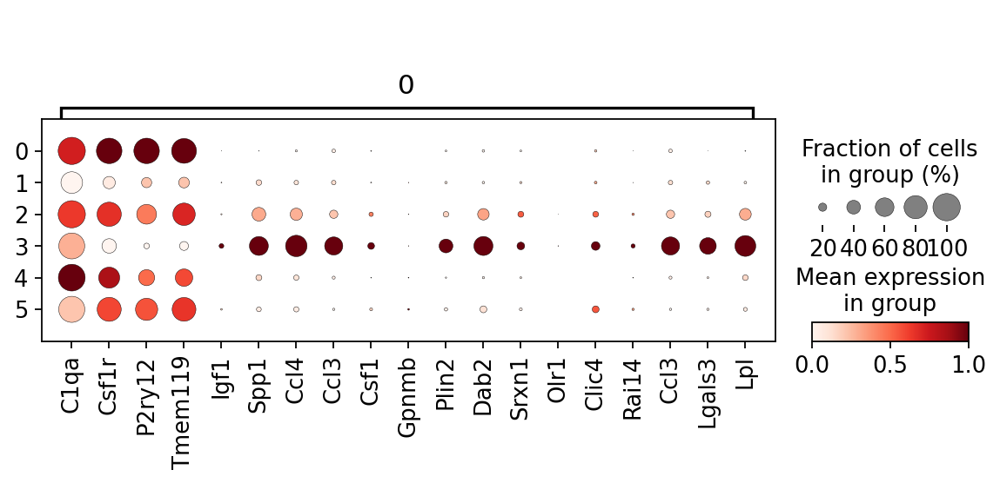

In [58]:
# 确保groupby列的标签先转换为字符串，然后转换为分类类型
adata.obs['RNA_snn_res.0.3'] = adata.obs['RNA_snn_res.0.3'].astype(str).astype('category')

# 再次运行sc.tl.dendrogram
sc.tl.dendrogram(adata, groupby='RNA_snn_res.0.3')

# 尝试运行sc.pl.dotplot
sc.pl.dotplot(adata, 
              var_names=marker_genes_dict, 
              groupby='RNA_snn_res.0.3', 
              #dendrogram=True,
              standard_scale="var")


In [12]:
import omicverse as ov
print(f'omicverse version: {ov.__version__}')
import scanpy as sc
print(f'scanpy version: {sc.__version__}')
ov.ov_plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.7, Tutorials: https://omicverse.readthedocs.io/
omicverse version: 1.5.7
scanpy version: 1.9.6


In [55]:
new_order = ["Mm_Sham1","Mm_Sham2","Mm_Sham3","Mm_S4h","Mm_S1d","Mm_S3d","Mm_S7d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['sample'] = pd.Categorical(adata.obs['orig.ident'], categories=new_order, ordered=True)
new_order = ["Sham","S4h","S1d","S3d","S7d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['group'] = pd.Categorical(adata.obs['group'], categories=new_order, ordered=True)


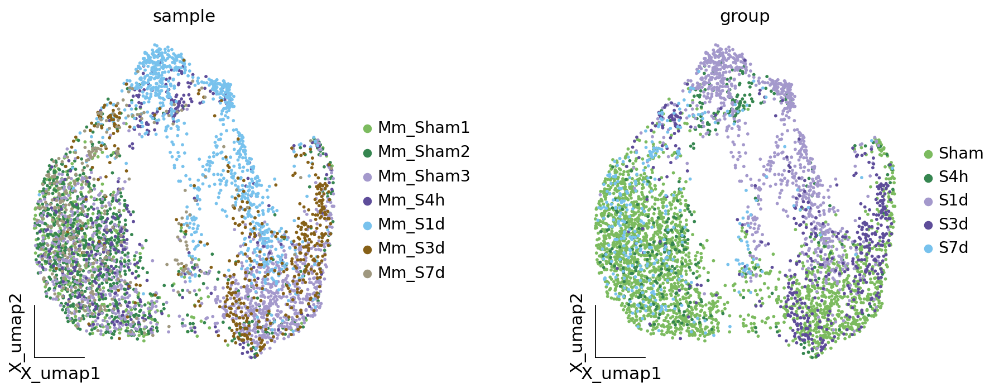

In [56]:
ov.utils.embedding(adata,
                basis='X_umap',
                color=[ "sample","group"],
                title=['sample','group'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small')
# 调整图像大小，设置为宽10英寸、高6英寸
plt.gcf().set_size_inches(13, 5)
# 使用matplotlib保存图像
plt.savefig("figures/GSE142445(sample).pdf",dpi=300)

In [ ]:
#GSE174574

In [2]:
#adata = sc.read(f'/home/xll/HIE/GSE174574/AB.h5ad')
adata = sc.read(f'/home/xll/HIE/GSE174574/scRNA.h5ad')
#adata

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [3]:
#可视化
# 导包
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

# 设置全局参数
#sc.set_figure_params(dpi=600, color_map = 'viridis_r')
#sc.settings.verbosity = 1
#sc.logging.print_header()

In [5]:
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


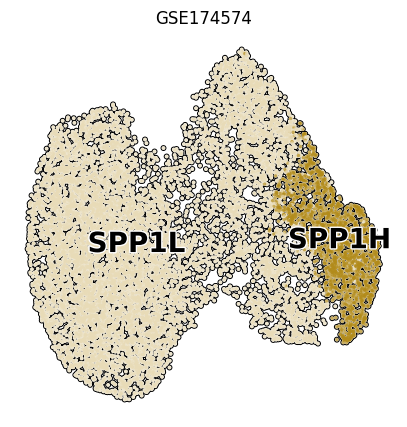

In [7]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='celltype', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='GSE174574',  # 设置标题
               palette=['#B28B1A','#E8DBB7'],  # 设置颜色主题
               size=25,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/GSE174574(celltype).pdf",dpi=300)

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


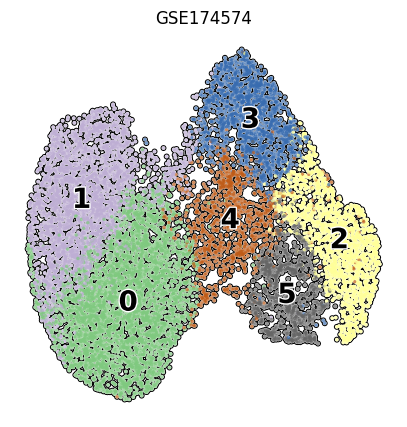

In [7]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='seurat_clusters', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='GSE174574',  # 设置标题
               palette='Accent',  # 设置颜色主题
               size=25,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/GSE174574.pdf",dpi=300)

In [8]:
marker_genes_dict = {
    '0': ["C1qa","Csf1r","P2ry12",'Tmem119',"Igf1","Spp1","Ccl4","Ccl3","Csf1","Gpnmb",
          "Plin2","Dab2","Srxn1","Olr1","Clic4","Rai14","Ccl3","Lgals3","Lpl"]
}

In [9]:
adata

AnnData object with n_obs × n_vars = 11917 × 18676
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.4', 'seurat_clusters', 'group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors', 'seurat_clusters_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


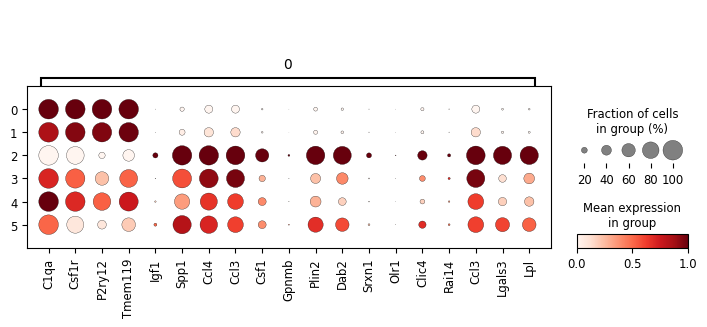

In [10]:
# 确保groupby列的标签先转换为字符串，然后转换为分类类型
adata.obs['RNA_snn_res.0.4'] = adata.obs['RNA_snn_res.0.4'].astype(str).astype('category')

# 再次运行sc.tl.dendrogram
sc.tl.dendrogram(adata, groupby='RNA_snn_res.0.4')

# 尝试运行sc.pl.dotplot
sc.pl.dotplot(adata, 
              var_names=marker_genes_dict, 
              groupby='RNA_snn_res.0.4', 
              #dendrogram=True,
              standard_scale="var")


In [14]:
# 更新 new_order 列表以反映更改后的名称
new_order = ["Mm_Sham1", "Mm_Sham2", "Mm_Sham3", "Mm_S1d1", "Mm_S1d2", "Mm_S1d3"]  # 新的顺序

# 替换值
adata.obs['orig.ident'] = adata.obs['orig.ident'].replace({
    "Mm_S1a": "Mm_S1d1",
    "Mm_S1b": "Mm_S1d2",
    "Mm_S1c": "Mm_S1d3"
})

# 将更新后的 orig.ident 列转换为有序分类数据，并赋值给新的 'sample' 列
adata.obs['sample'] = pd.Categorical(adata.obs['orig.ident'], categories=new_order, ordered=True)

new_order = ["Sham","S1d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['group'] = pd.Categorical(adata.obs['group'], categories=new_order, ordered=True)


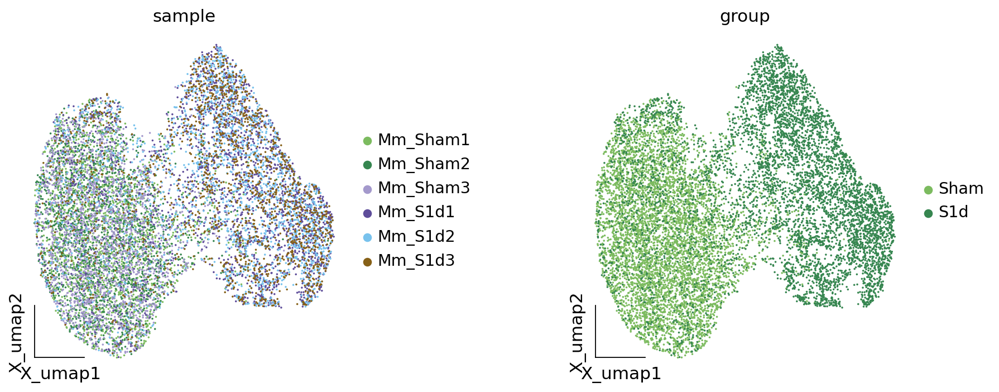

In [15]:
ov.utils.embedding(adata,
                basis='X_umap',
                color=[ "sample","group"],
                title=['sample','group'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small')
# 调整图像大小，设置为宽10英寸、高6英寸
plt.gcf().set_size_inches(13, 5)
# 使用matplotlib保存图像
plt.savefig("figures/GSE174574(sample).pdf",dpi=300)

In [ ]:
#GSE225948

In [2]:
#adata = sc.read(f'/home/xll/HIE/GSE225948/AB.h5ad')
adata = sc.read(f'/home/xll/HIE/GSE225948/scRNA.h5ad')
#adata

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [3]:
#可视化
# 导包
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

# 设置全局参数
#sc.set_figure_params(dpi=600, color_map = 'viridis_r')
#sc.settings.verbosity = 1
#sc.logging.print_header()

In [4]:
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


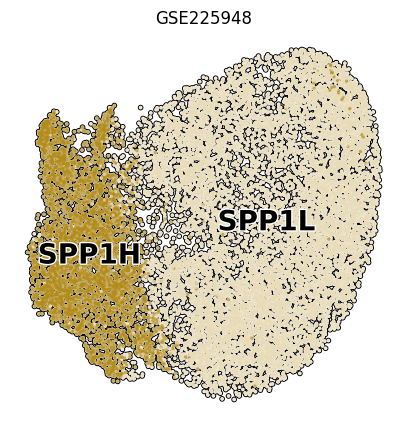

In [5]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='celltype', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='GSE225948',  # 设置标题
               palette=['#B28B1A','#E8DBB7'],  # 设置颜色主题
               size=23,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/GSE225948(celltype).pdf",dpi=300)

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


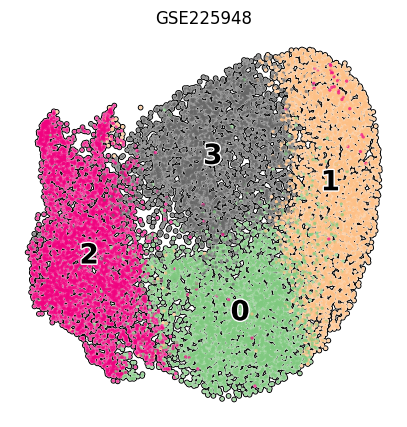

In [8]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='seurat_clusters', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='GSE225948',  # 设置标题
               palette='Accent',  # 设置颜色主题
               size=23,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/GSE225948.pdf",dpi=300)

In [9]:
marker_genes_dict = {
    '0': ["C1qa","Csf1r","P2ry12",'Tmem119',"Igf1","Spp1","Ccl4","Ccl3","Csf1","Gpnmb",
          "Plin2","Dab2","Srxn1","Olr1","Clic4","Rai14","Ccl3","Lgals3","Lpl"]
}

In [10]:
adata

AnnData object with n_obs × n_vars = 16016 × 19696
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'RNA_snn_res.0.3', 'group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors', 'seurat_clusters_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


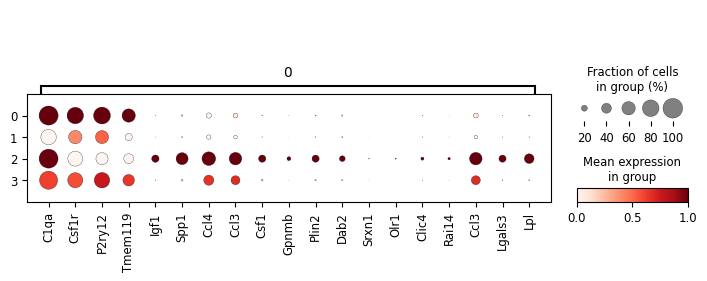

In [11]:
# 确保groupby列的标签先转换为字符串，然后转换为分类类型
adata.obs['RNA_snn_res.0.3'] = adata.obs['RNA_snn_res.0.3'].astype(str).astype('category')

# 再次运行sc.tl.dendrogram
sc.tl.dendrogram(adata, groupby='RNA_snn_res.0.3')

# 尝试运行sc.pl.dotplot
sc.pl.dotplot(adata, 
              var_names=marker_genes_dict, 
              groupby='RNA_snn_res.0.3', 
              #dendrogram=True,
              standard_scale="var")


In [12]:
# 更新 new_order 列表以反映更改后的名称
new_order = ["Mm_Sham1", "Mm_Sham2", "Mm_Sham3", "Mm_Sham4", "Mm_S2d1", "Mm_S2d2", "Mm_S2d3", "Mm_S2d4", "Mm_S14d1", "Mm_S14d2", "Mm_S14d3", "Mm_S14d4"]  # 新的顺序

# 替换值
adata.obs['orig.ident'] = adata.obs['orig.ident'].replace({
    "Mm_Mcao2d1": "Mm_S2d1","Mm_Mcao2d2": "Mm_S2d2","Mm_Mcao2d3": "Mm_S2d3","Mm_Mcao2d4": "Mm_S2d4",
    "Mm_Mcao14d1": "Mm_S14d1","Mm_Mcao14d2": "Mm_S14d2","Mm_Mcao14d3": "Mm_S14d3","Mm_Mcao14d4": "Mm_S14d4"
})

# 将更新后的 orig.ident 列转换为有序分类数据，并赋值给新的 'sample' 列
adata.obs['sample'] = pd.Categorical(adata.obs['orig.ident'], categories=new_order, ordered=True)

new_order = ["Sham","S2d","S14d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['group'] = pd.Categorical(adata.obs['group'], categories=new_order, ordered=True)


In [13]:
import omicverse as ov
print(f'omicverse version: {ov.__version__}')
import scanpy as sc
print(f'scanpy version: {sc.__version__}')
ov.ov_plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.7, Tutorials: https://omicverse.readthedocs.io/
omicverse version: 1.5.7
scanpy version: 1.9.6


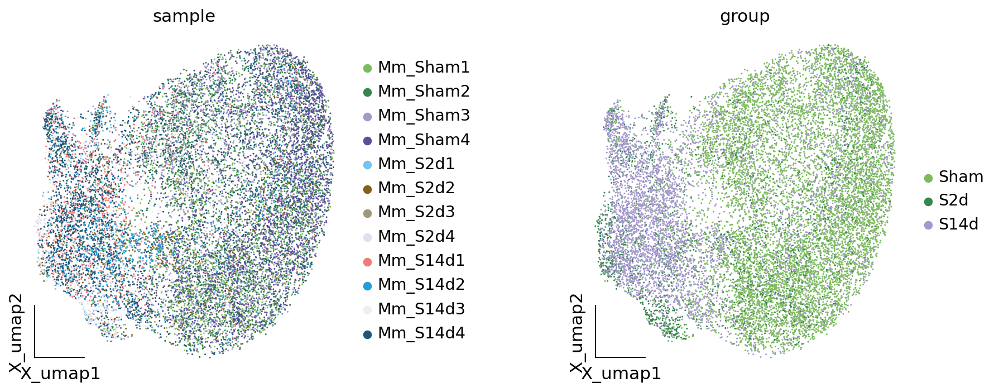

In [14]:
ov.utils.embedding(adata,
                basis='X_umap',
                color=[ "sample","group"],
                title=['sample','group'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small')
# 调整图像大小，设置为宽10英寸、高6英寸
plt.gcf().set_size_inches(13, 5)
# 使用matplotlib保存图像
plt.savefig("figures/GSE225948(sample).pdf",dpi=300)

In [ ]:
#GSE227651

In [2]:
adata = sc.read(f'/home/xll/HIE/GSE227651/AB.h5ad')
adata

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


AnnData object with n_obs × n_vars = 1100 × 24357
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.4', 'seurat_clusters', 'RNA_snn_res.0.1', 'group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

In [3]:
#可视化
# 导包
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

# 设置全局参数
#sc.set_figure_params(dpi=600, color_map = 'viridis_r')
#sc.settings.verbosity = 1
#sc.logging.print_header()

In [4]:
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype('category')

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


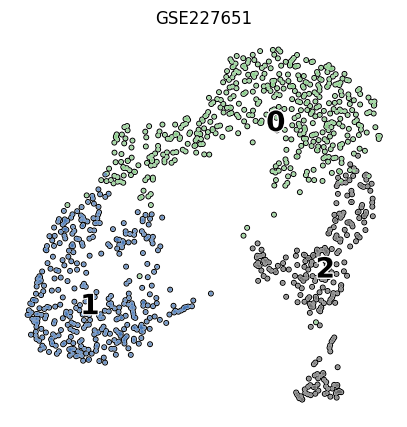

In [5]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='seurat_clusters', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='GSE227651',  # 设置标题
               palette='Accent',  # 设置颜色主题
               size=25,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/GSE227651.pdf",dpi=300)

In [6]:
marker_genes_dict = {
    '0': ["C1qa","Csf1r","P2ry12",'Tmem119',"Igf1","Spp1","Ccl4","Ccl3","Csf1","Gpnmb",
          "Plin2","Dab2","Srxn1","Olr1","Clic4","Rai14","Ccl3","Lgals3","Lpl"]
}

In [7]:
adata

AnnData object with n_obs × n_vars = 1100 × 24357
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.4', 'seurat_clusters', 'RNA_snn_res.0.1', 'group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors', 'seurat_clusters_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


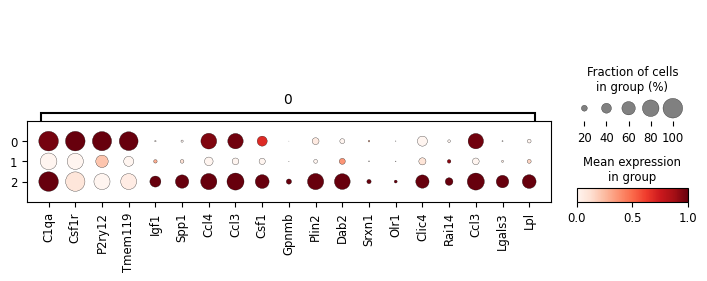

In [8]:
# 确保groupby列的标签先转换为字符串，然后转换为分类类型
adata.obs['RNA_snn_res.0.1'] = adata.obs['RNA_snn_res.0.1'].astype(str).astype('category')

# 再次运行sc.tl.dendrogram
sc.tl.dendrogram(adata, groupby='RNA_snn_res.0.1')

# 尝试运行sc.pl.dotplot
sc.pl.dotplot(adata, 
              var_names=marker_genes_dict, 
              groupby='RNA_snn_res.0.1', 
              #dendrogram=True,
              standard_scale="var")


In [9]:
new_order = ["Mm_Sham","Mm_S1d","Mm_S3d","Mm_S7d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['sample'] = pd.Categorical(adata.obs['orig.ident'], categories=new_order, ordered=True)


new_order = ["Sham","S1d","S3d","S7d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['group'] = pd.Categorical(adata.obs['group'], categories=new_order, ordered=True)


In [10]:
import omicverse as ov
print(f'omicverse version: {ov.__version__}')
import scanpy as sc
print(f'scanpy version: {sc.__version__}')
ov.ov_plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.7, Tutorials: https://omicverse.readthedocs.io/
omicverse version: 1.5.7
scanpy version: 1.9.6


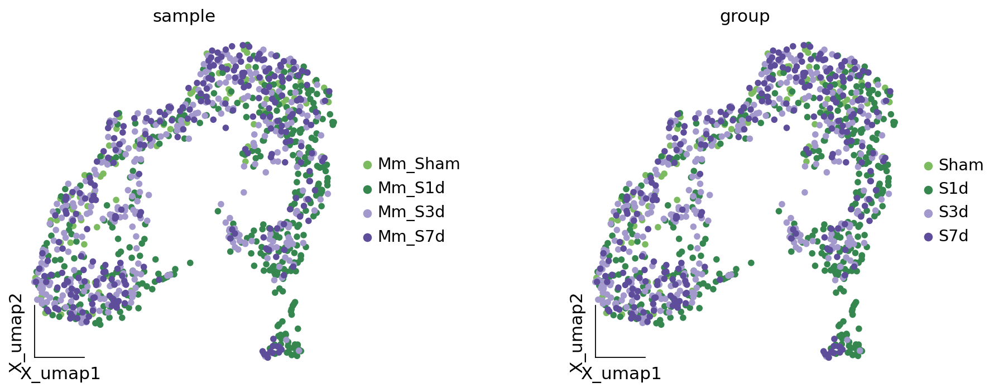

In [11]:
ov.utils.embedding(adata,
                basis='X_umap',
                color=[ "sample","group"],
                title=['sample','group'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small')
# 调整图像大小，设置为宽10英寸、高6英寸
plt.gcf().set_size_inches(13, 5)
# 使用matplotlib保存图像
plt.savefig("figures/GSE227651(sample).pdf",dpi=300)

In [ ]:
#SRP465344

In [2]:
#adata = sc.read(f'/home/xll/HIE/SRP465344/AB.h5ad')
adata = sc.read(f'/home/xll/HIE/SRP465344/scRNA.h5ad')
#adata

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [3]:
#可视化
# 导包
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

# 设置全局参数
#sc.set_figure_params(dpi=600, color_map = 'viridis_r')
#sc.settings.verbosity = 1
#sc.logging.print_header()

In [4]:
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


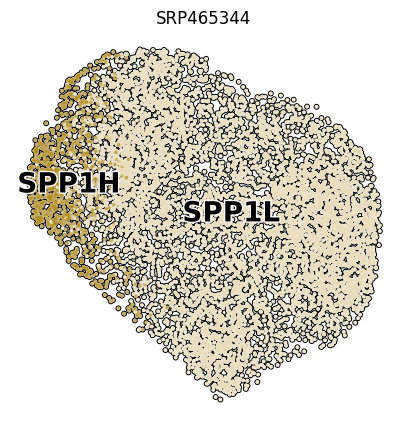

In [5]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='celltype', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='SRP465344',  # 设置标题
               palette=['#B28B1A','#E8DBB7'],  # 设置颜色主题
               size=25,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/SRP465344(celltype).pdf",dpi=300)

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


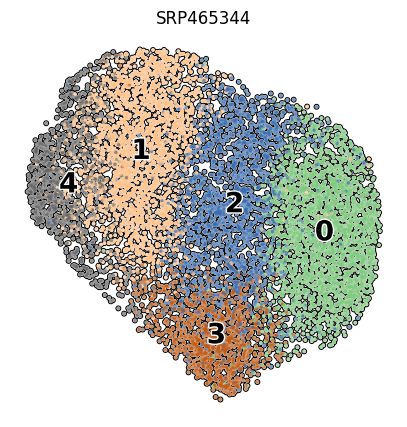

In [5]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='seurat_clusters', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='SRP465344',  # 设置标题
               palette='Accent',  # 设置颜色主题
               size=25,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/SRP465344.pdf",dpi=300)

In [6]:
marker_genes_dict = {
    '0': ["C1qa","Csf1r","P2ry12",'Tmem119',"Igf1","Spp1","Ccl4","Ccl3","Csf1","Gpnmb",
          "Plin2","Dab2","Srxn1","Olr1","Clic4","Rai14","Ccl3","Lgals3","Lpl"]
}

In [7]:
adata

AnnData object with n_obs × n_vars = 10288 × 24510
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.4', 'seurat_clusters', 'group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors', 'seurat_clusters_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


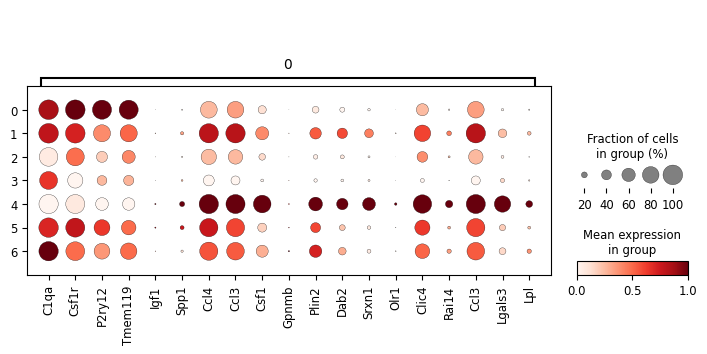

In [8]:
# 确保groupby列的标签先转换为字符串，然后转换为分类类型
adata.obs['RNA_snn_res.0.4'] = adata.obs['RNA_snn_res.0.4'].astype(str).astype('category')

# 再次运行sc.tl.dendrogram
sc.tl.dendrogram(adata, groupby='RNA_snn_res.0.4')

# 尝试运行sc.pl.dotplot
sc.pl.dotplot(adata, 
              var_names=marker_genes_dict, 
              groupby='RNA_snn_res.0.4', 
              #dendrogram=True,
              standard_scale="var")

In [6]:
new_order = ["Mm_Sham","Mm_S3h","Mm_S12h","Mm_S3d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['sample'] = pd.Categorical(adata.obs['orig.ident'], categories=new_order, ordered=True)


new_order = ["Sham","S3h","S12h","S3d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['group'] = pd.Categorical(adata.obs['group'], categories=new_order, ordered=True)

In [7]:
import omicverse as ov
print(f'omicverse version: {ov.__version__}')
import scanpy as sc
print(f'scanpy version: {sc.__version__}')
ov.ov_plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.7, Tutorials: https://omicverse.readthedocs.io/
omicverse version: 1.5.7
scanpy version: 1.9.6


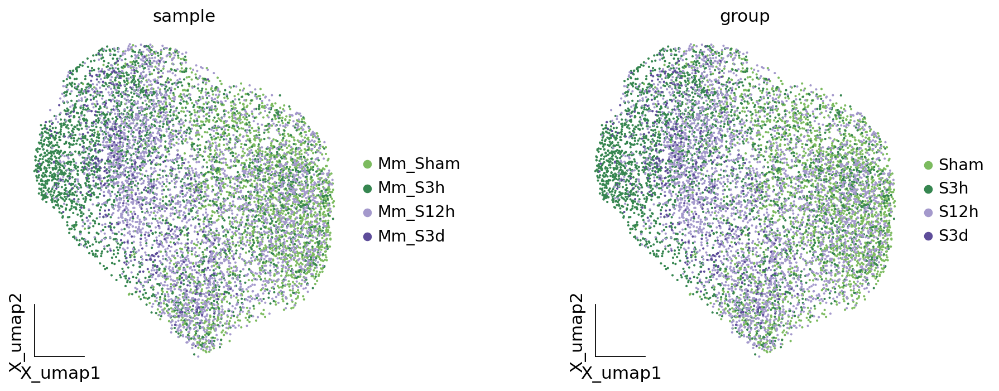

In [8]:
ov.utils.embedding(adata,
                basis='X_umap',
                color=[ "sample","group"],
                title=['sample','group'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small')
# 调整图像大小，设置为宽10英寸、高6英寸
plt.gcf().set_size_inches(13, 5)
# 使用matplotlib保存图像
plt.savefig("figures/SRP465344(sample).pdf",dpi=300)

In [ ]:
#MG7

In [211]:
#adata = sc.read(f'/home/xll/HIE/MG7/AB.h5ad')
adata = sc.read(f'/home/xll/HIE/MG7/scRNA.h5ad')
#adata

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [10]:
#可视化
# 导包
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

# 设置全局参数
#sc.set_figure_params(dpi=600, color_map = 'viridis_r')
#sc.settings.verbosity = 1
#sc.logging.print_header()

In [135]:
#adata.obs['celltype'] = adata.obs['celltype'].astype('category')
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype('category')


/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


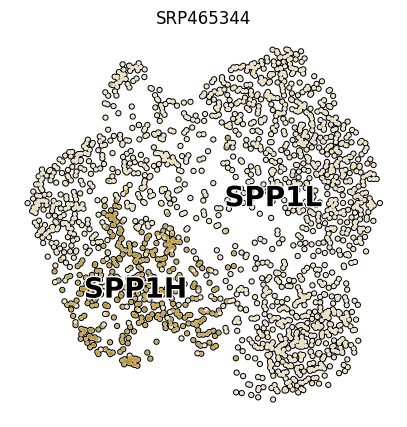

In [212]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='celltype', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=20,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='SRP465344',  # 设置标题
               palette=['#B28B1A','#E8DBB7'],  # 设置颜色主题
               size=28,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/MG7(celltype).pdf",dpi=300)

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


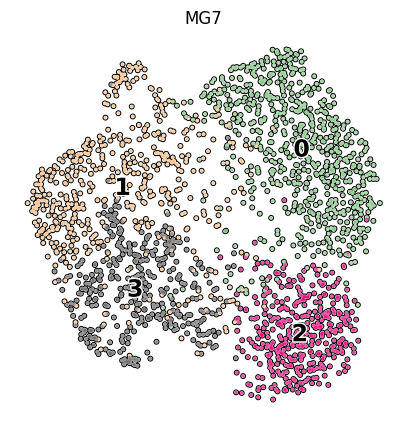

In [7]:
# 分群，并设置分群结果信息存储在"cluster"中
# sc.tl.leiden(adata, key_added='seurat_clusters', resolution=0.8)
#流行色板：'viridis','plasma','inferno','magma','cividis','tab10','tab20','Set2','Set3'
# 绘图
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='seurat_clusters', 
               add_outline=True,  # 添加cluster外部轮廓
               legend_loc='on data',  # 将cluster标签直接在细胞群上显示
               legend_fontsize=17,  # 设置cluster标签字体大小
               legend_fontoutline=2,  # 设置cluster标签外部留白大小
               frameon=False,  # 取消边框
               title='MG7',  # 设置标题
               palette='Accent',  # 设置颜色主题
               size=25,
               show=False)  # 不立即显示图像

# 使用matplotlib保存图像
plt.savefig("figures/MG7.pdf",dpi=600)

In [35]:
marker_genes_dict = {
    '0': ["C1qa","Csf1r","P2ry12",'Tmem119',"Igf1","Spp1","Ccl4","Ccl3","Csf1","Gpnmb",
          "Plin2","Dab2","Olr1","Clic4","Rai14","Ccl3","Lgals3","Lpl",'Nfatc2','Nfatc1','Plcg1','Ppp3cb','Lyn']
}

In [36]:
adata

AnnData object with n_obs × n_vars = 1990 × 19039
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'age', 'integrated_snn_res.1.2', 'seurat_clusters', 'celltype', 'integrated_snn_res.0.5', 'percent.mt', 'RNA_snn_res.0.4', 'group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors', 'dendrogram_seurat_clusters'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


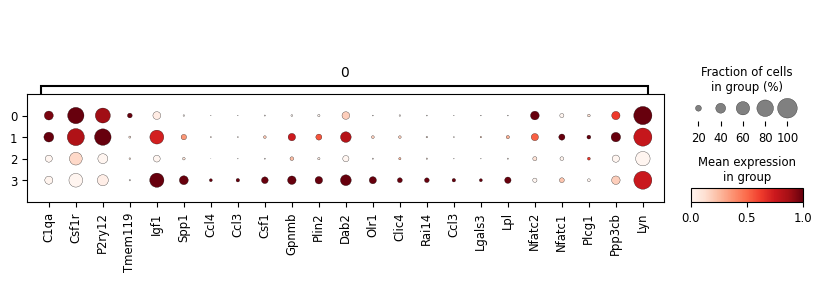

In [37]:
# 确保groupby列的标签先转换为字符串，然后转换为分类类型
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype(str).astype('category')

# 再次运行sc.tl.dendrogram
sc.tl.dendrogram(adata, groupby='seurat_clusters')

# 尝试运行sc.pl.dotplot
sc.pl.dotplot(adata, 
              var_names=marker_genes_dict, 
              groupby='seurat_clusters', 
              #dendrogram=True,
              standard_scale="var")

In [20]:
new_order = ["SD_Sham","SD_Sham3d","SD_Sham7d","SD_1h","SD_4h","SD_12h","SD_3d","SD_7d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['sample'] = pd.Categorical(adata.obs['orig.ident'], categories=new_order, ordered=True)

new_order = ["Sham","1h","4h","12h","3d","7d"]  # 替换为您的具体 celltype 名称
# 将 celltype 列转换为分类数据，并应用新的顺序
adata.obs['group'] = pd.Categorical(adata.obs['group'], categories=new_order, ordered=True)



In [17]:
import omicverse as ov
print(f'omicverse version: {ov.__version__}')
import scanpy as sc
print(f'scanpy version: {sc.__version__}')
ov.ov_plot_set()

omicverse version: 1.5.7
scanpy version: 1.9.6


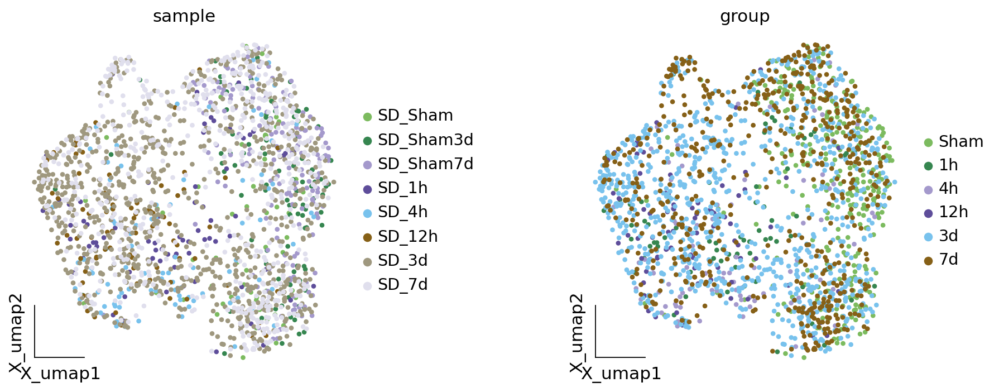

In [21]:
ov.utils.embedding(adata,
                basis='X_umap',
                color=[ "sample","group"],
                title=['sample','group'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small')
# 调整图像大小，设置为宽10英寸、高6英寸
plt.gcf().set_size_inches(13, 5)
# 使用matplotlib保存图像
plt.savefig("figures/MG7(sample).pdf",dpi=300)

In [160]:
#adata = sc.read(f'/home/xll/HIE/MG7(raw)/AB.h5ad')
adata = sc.read(f'/home/xll/HIE/MG7/scRNA.h5ad')
adata

/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/xll/miniconda3/envs/jupyter_notebook/lib/python3.10/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


AnnData object with n_obs × n_vars = 1990 × 19039
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'age', 'integrated_snn_res.1.2', 'seurat_clusters', 'celltype', 'integrated_snn_res.0.5', 'percent.mt', 'RNA_snn_res.0.4', 'group'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

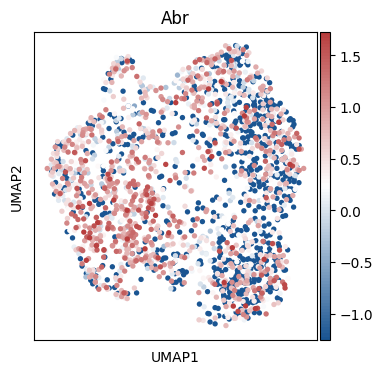

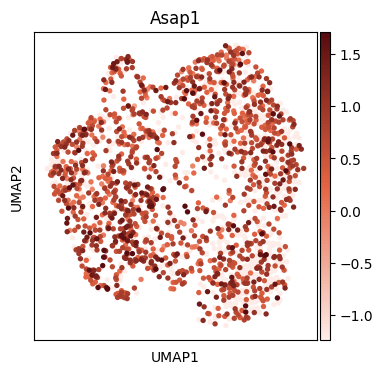

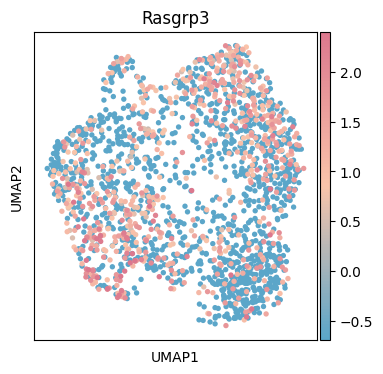

In [258]:
#import matplotlib.pyplot as plt
#import scanpy as sc
#from matplotlib.colors import LinearSegmentedColormap

# 定义自定义的颜色映射
#cmap1 = LinearSegmentedColormap.from_list("custom_cmap1", ['#1A5592','white',"#B83D3D"], N=100)
#cmap2 = LinearSegmentedColormap.from_list("custom_cmap2", ["#FDECE7","#E46443", "#570B0F"], N=100)
#cmap3 = LinearSegmentedColormap.from_list("custom_cmap3", ["#5BA6C9", "#FAC4AA", "#DC788E"], N=100)

# 使用rc_context设置图形大小
#with plt.rc_context({'figure.figsize': (4, 4)}):
    # 为特定基因绘制UMAP图，使用自定义的颜色映射
    #sc.pl.umap(adata, color="Abr", s=60, vmax='p99', color_map=cmap1, show=True)
    #sc.pl.umap(adata, color="Asap1", s=60, vmax='p99', color_map=cmap2, show=True)
    #sc.pl.umap(adata, color="Rasgrp3", s=60, vmax='p99', color_map=cmap3, show=True)


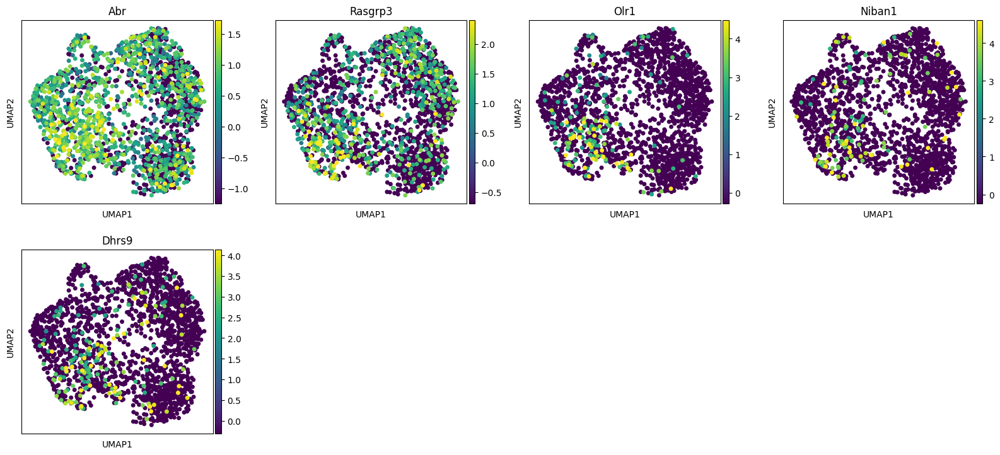

In [285]:
adata.raw = adata
# vmax控制最大值
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=["Abr","Rasgrp3","Olr1","Niban1","Dhrs9"],s=100,
               vmax='p99',
               show=False) # 简单的设定数字上限

# 使用matplotlib保存图像
plt.savefig("figures/4gene.pdf",dpi=300)

In [ ]:
#End